In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/dtsfordetection/6.jpg
/kaggle/input/dtsfordetection/5.jpg
/kaggle/input/dtsfordetection/8.jpg
/kaggle/input/dtsfordetection/10.jpg
/kaggle/input/dtsfordetection/1_target.jpg
/kaggle/input/dtsfordetection/9.jpg
/kaggle/input/dtsfordetection/1.jpg
/kaggle/input/dtsfordetection/7.jpg
/kaggle/input/dtsfordetection/13.jpg
/kaggle/input/dtsfordetection/15.jpg
/kaggle/input/dtsfordetection/12.jpg
/kaggle/input/dtsfordetection/11.jpg
/kaggle/input/dtsfordetection/4.jpg
/kaggle/input/dtsfordetection/3.jpg
/kaggle/input/dtsfordetection/14.jpg
/kaggle/input/dtsfordetection/2.jpg


In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os


In [3]:
os.makedirs('/kaggle/working/extracted_objects', exist_ok=True)

target_path = '/kaggle/input/dtsfordetection/1_target.jpg'
target = cv2.imread(target_path)
target_gray = cv2.cvtColor(target, cv2.COLOR_BGR2GRAY)

group1_scales = np.linspace(0.55, 0.65, 15)  # Cho ảnh 1, 2, 5, 9, 11, 13, 14
group2_scales = np.linspace(0.70, 0.80, 15)  # Cho ảnh 3, 6, 7, 8, 12, 15
group3_scales = np.linspace(0.45, 0.55, 15)  # Mở rộng xuống dưới cho ảnh 4
# Scale mới cho ảnh 10
img10_scales = np.linspace(1.0, 1.4, 20)  # Scale lớn hơn cho ảnh 10.jpg

# Phân loại các ảnh vào các nhóm dựa trên kết quả trước đó
group1_images = [1, 2, 5, 9, 11, 13, 14]  
group2_images = [3, 6, 7, 8, 12, 15]

canny_values = [
    (25, 75),   
    (50, 150),   
    (75, 225),  
    (100, 300), 
    (30, 150), 
    (10, 250),  
]

threshold_normal = 1000000
threshold_img4 = 500000  # Threshold thấp hơn cho ảnh 4
best_results = {}


In [4]:
for img_num in range(1, 16):
    path = f'/kaggle/input/dtsfordetection/{img_num}.jpg'
    
    obj = cv2.imread(path)
    if obj is None:
        print(f"Không thể đọc {path}")
        continue
    
    obj_gray = cv2.cvtColor(obj, cv2.COLOR_BGR2GRAY)
    
    if img_num == 10:
        # Sử dụng scale mới cho ảnh 10
        scales_to_try = img10_scales
        canny_settings = canny_values  
        current_threshold = threshold_normal
    elif img_num == 4:
        scales_to_try = np.concatenate([group3_scales, group1_scales, group2_scales])
        canny_settings = canny_values
        current_threshold = threshold_img4
    elif img_num in group1_images:
        scales_to_try = group1_scales
        canny_settings = [(50, 150)]
        current_threshold = threshold_normal
    elif img_num in group2_images:
        scales_to_try = group2_scales
        canny_settings = [(50, 150)]  
        current_threshold = threshold_normal
    else:
        scales_to_try = np.concatenate([group1_scales, group2_scales])
        canny_settings = [(50, 150)]  
        current_threshold = threshold_normal
    
    best_scale = None
    best_val = -float('inf')
    best_loc = None
    best_w, best_h = 0, 0
    best_canny = None
    best_target_edges = None
    best_obj_edges = None
    
    for canny_low, canny_high in canny_settings:
        
        target_edges = cv2.Canny(target_gray, canny_low, canny_high)
        obj_edges = cv2.Canny(obj_gray, canny_low, canny_high)
        
        for scale in scales_to_try:
            width = int(obj_edges.shape[1] * scale)
            height = int(obj_edges.shape[0] * scale)
            # Skip qua những ảnh quá nhỏ 
            if width < 10 or height < 10:
                continue
            
            if width > target_edges.shape[1] or height > target_edges.shape[0]:
                continue
            
            obj_edges_resized = cv2.resize(obj_edges, (width, height), interpolation=cv2.INTER_AREA)
            
            # Thực hiện template matching với phương pháp TM_CCOEFF
            res = cv2.matchTemplate(target_edges, obj_edges_resized, cv2.TM_CCOEFF)
            min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
            
            if max_val > best_val:
                best_val = max_val
                best_loc = max_loc
                best_scale = scale
                best_w, best_h = width, height
                best_canny = (canny_low, canny_high)
                best_target_edges = target_edges.copy()
                best_obj_edges = obj_edges.copy()

    best_results[img_num] = {
        'path': path,
        'best_scale': best_scale,
        'best_val': best_val,
        'best_loc': best_loc,
        'best_w': best_w,
        'best_h': best_h,
        'obj': obj,
        'obj_edges': best_obj_edges,
        'target_edges': best_target_edges,
        'threshold': current_threshold,
        'canny': best_canny
    }
    
    if img_num == 10:
        print(f"Ảnh 10.jpg - Scale tốt nhất: {best_scale:.2f}, Score: {best_val:.2f}, Canny: {best_canny}")
    
    results_sorted = [best_results[i] for i in range(1, 16) if i in best_results]

Ảnh 10.jpg - Scale tốt nhất: 1.40, Score: 15316284.00, Canny: (100, 300)


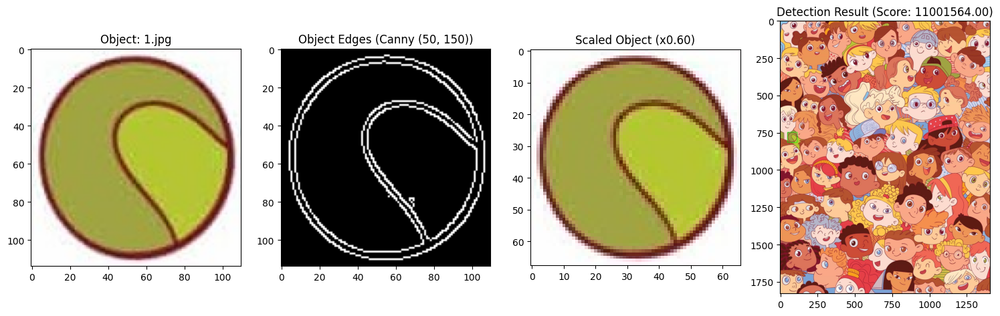

Found 1.jpg with scale 0.60, score 11001564.00, Canny (50, 150)


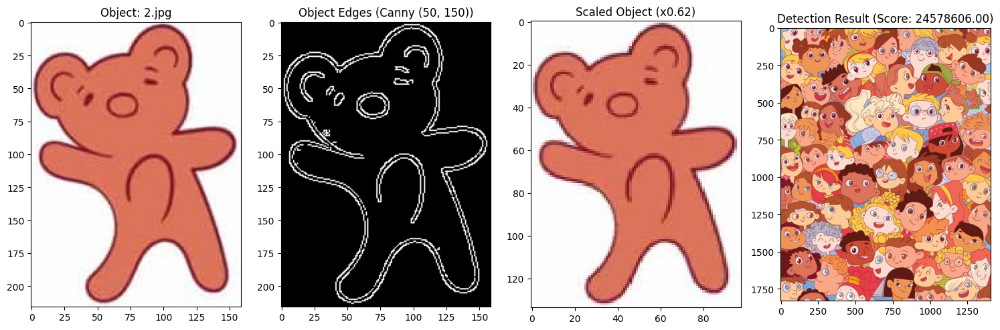

Found 2.jpg with scale 0.62, score 24578606.00, Canny (50, 150)


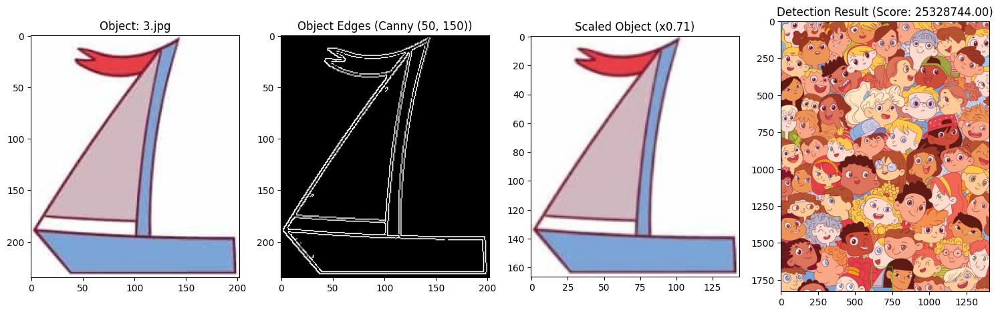

Found 3.jpg with scale 0.71, score 25328744.00, Canny (50, 150)


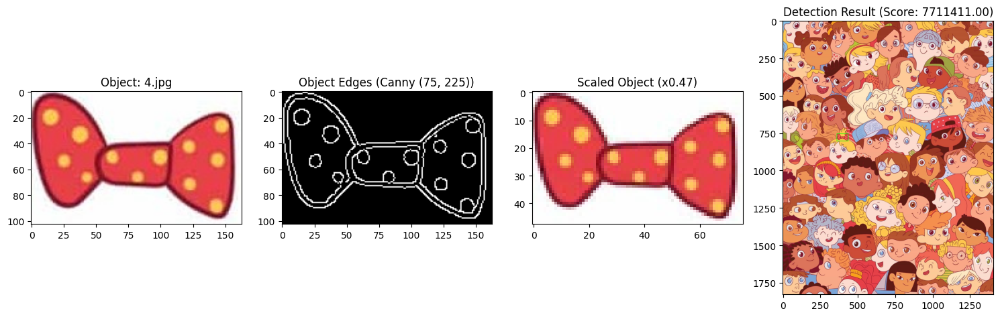

Found 4.jpg with scale 0.47, score 7711411.00, Canny (75, 225)


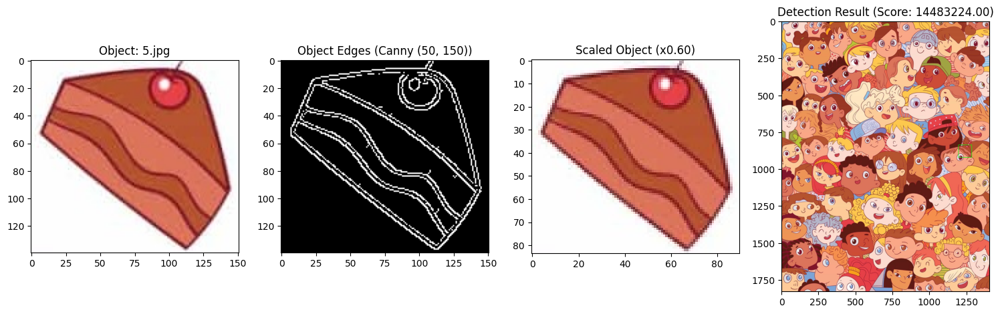

Found 5.jpg with scale 0.60, score 14483224.00, Canny (50, 150)


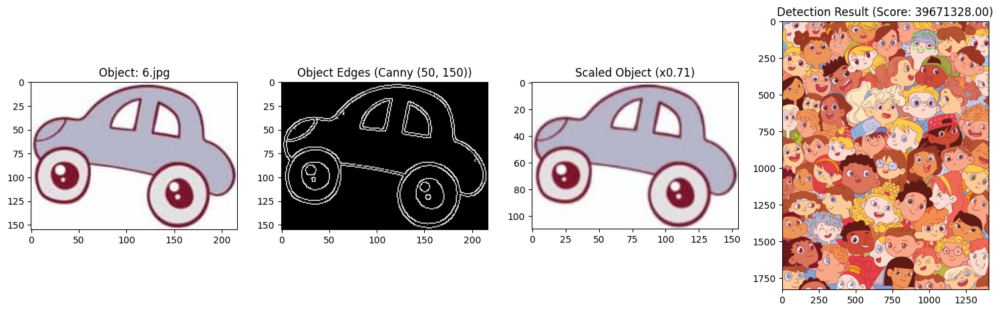

Found 6.jpg with scale 0.71, score 39671328.00, Canny (50, 150)


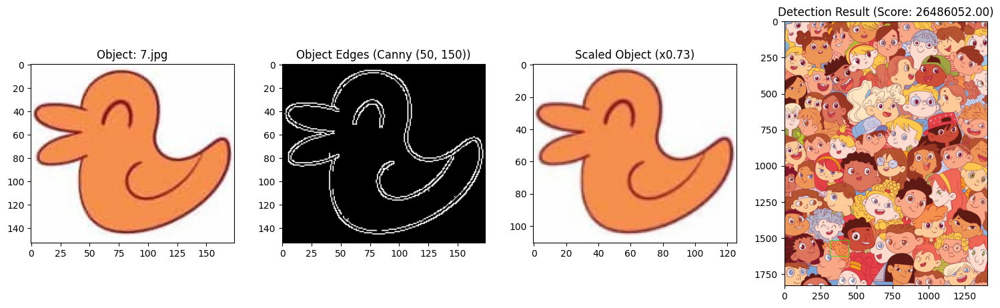

Found 7.jpg with scale 0.73, score 26486052.00, Canny (50, 150)


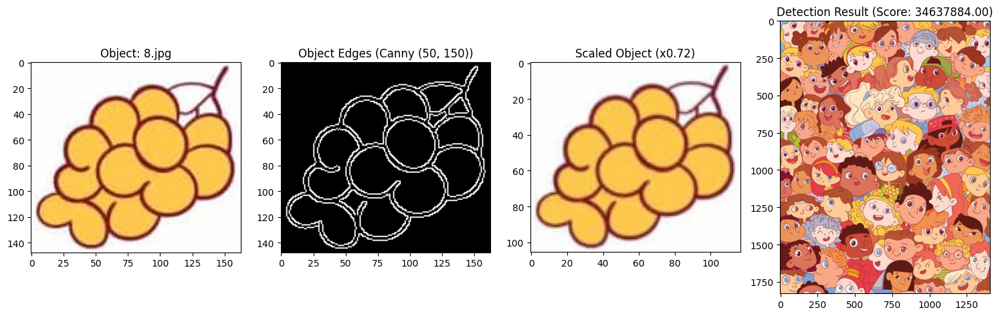

Found 8.jpg with scale 0.72, score 34637884.00, Canny (50, 150)


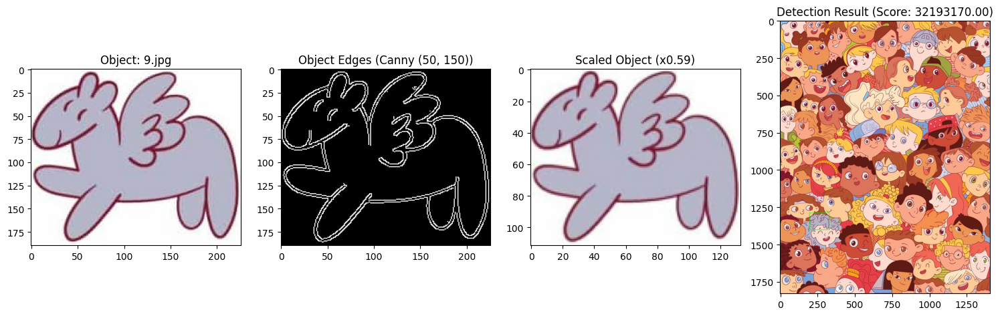

Found 9.jpg with scale 0.59, score 32193170.00, Canny (50, 150)


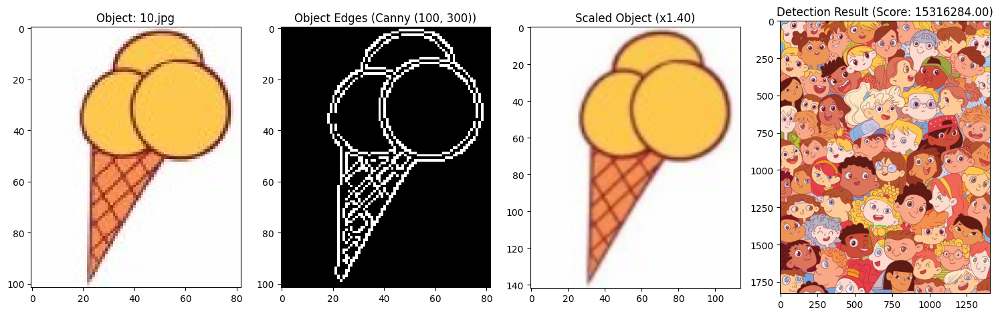

Found 10.jpg with scale 1.40, score 15316284.00, Canny (100, 300)


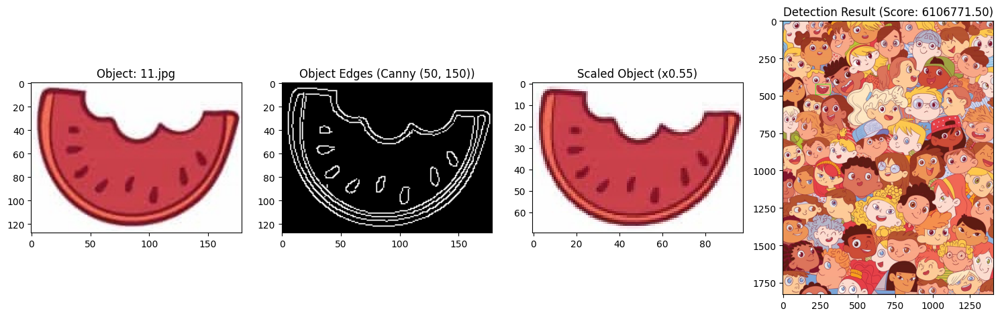

Found 11.jpg with scale 0.55, score 6106771.50, Canny (50, 150)


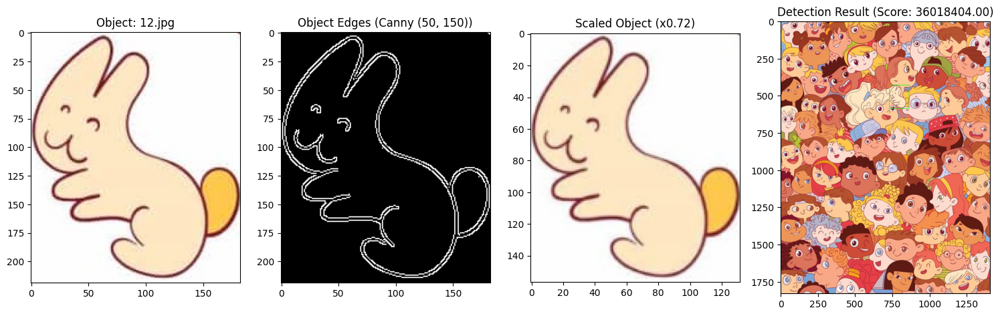

Found 12.jpg with scale 0.72, score 36018404.00, Canny (50, 150)


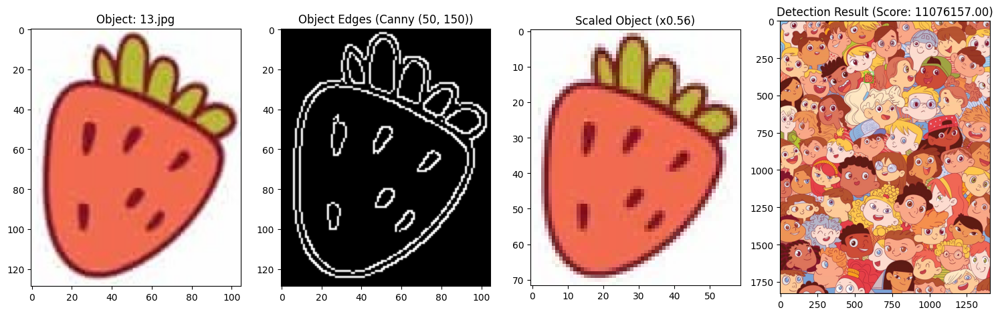

Found 13.jpg with scale 0.56, score 11076157.00, Canny (50, 150)


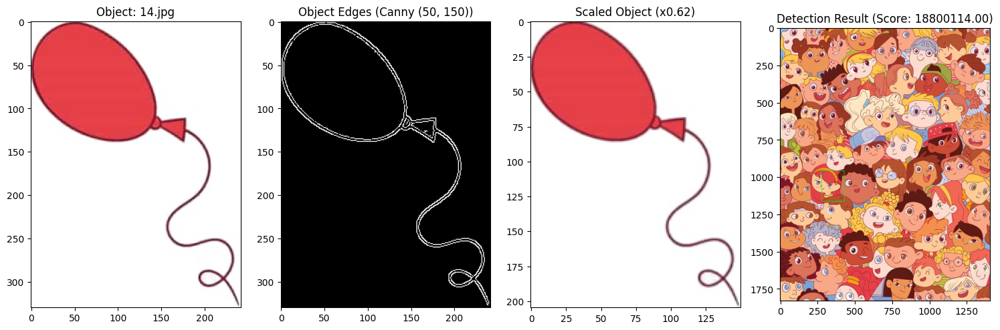

Found 14.jpg with scale 0.62, score 18800114.00, Canny (50, 150)


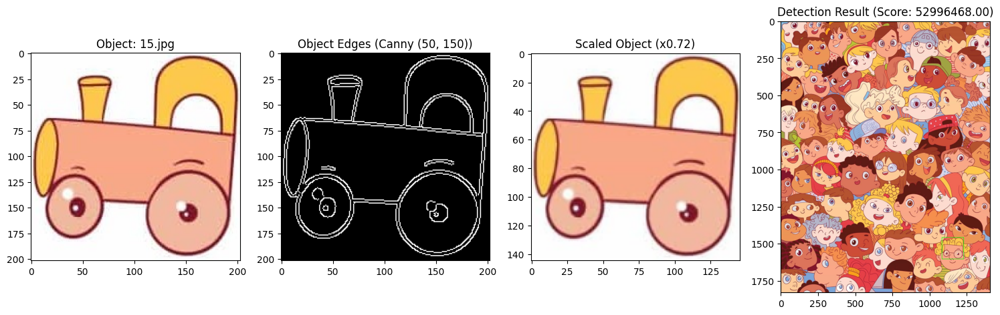

Found 15.jpg with scale 0.72, score 52996468.00, Canny (50, 150)


In [5]:
for result in results_sorted:
    path = result['path']
    best_scale = result['best_scale']
    best_val = result['best_val']
    best_loc = result['best_loc']
    best_w = result['best_w']
    best_h = result['best_h']
    obj = result['obj']
    obj_edges = result['obj_edges']
    threshold = result['threshold']
    canny_setting = result['canny']
    
    found = best_scale is not None and best_val > threshold
    
    if found:
        pt = best_loc
        result_img = target.copy()
        cv2.rectangle(result_img, pt, (pt[0] + best_w, pt[1] + best_h), (0, 255, 0), 2)
        
        object_region = target[pt[1]:pt[1]+best_h, pt[0]:pt[0]+best_w]
        
        # Save object detected
        file_name = os.path.basename(path)
        name_without_ext = os.path.splitext(file_name)[0]
        out_path = f'/kaggle/working/extracted_objects/{name_without_ext}_found.jpg'
        cv2.imwrite(out_path, object_region)
        
        plt.figure(figsize=(15, 5))
        
        plt.subplot(141)
        plt.imshow(cv2.cvtColor(obj, cv2.COLOR_BGR2RGB))
        plt.title(f'Object: {os.path.basename(path)}')
        
        plt.subplot(142)
        plt.imshow(obj_edges, cmap='gray')
        plt.title(f'Object Edges (Canny {canny_setting})')
 
        obj_resized = cv2.resize(obj, (best_w, best_h))
        plt.subplot(143)
        plt.imshow(cv2.cvtColor(obj_resized, cv2.COLOR_BGR2RGB))
        plt.title(f'Scaled Object (x{best_scale:.2f})')
        
        plt.subplot(144)
        plt.imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))
        plt.title(f'Detection Result (Score: {best_val:.2f})')
        
        plt.tight_layout()
        plt.show()
        
        print(f"Found {os.path.basename(path)} with scale {best_scale:.2f}, score {best_val:.2f}, Canny {canny_setting}")
    else:
        print(f"No matches found for {os.path.basename(path)} (Best score: {best_val:.2f}, Canny {canny_setting})")

In [6]:

print("File\t\tScale\tScore\tCanny\t\tResult")
for i in range(1, 16):
    result = best_results[i]
    path = result['path']
    best_scale = result['best_scale']
    best_val = result['best_val']
    threshold = result['threshold']
    canny = result['canny']
    found = best_val > threshold
    status = "Found" if found else "Not Found"
    print(f"{os.path.basename(path)}\t{best_scale:.2f}\t{best_val:.2f}\t{canny}\t{status}")

File		Scale	Score	Canny		Result
1.jpg	0.60	11001564.00	(50, 150)	Found
2.jpg	0.62	24578606.00	(50, 150)	Found
3.jpg	0.71	25328744.00	(50, 150)	Found
4.jpg	0.47	7711411.00	(75, 225)	Found
5.jpg	0.60	14483224.00	(50, 150)	Found
6.jpg	0.71	39671328.00	(50, 150)	Found
7.jpg	0.73	26486052.00	(50, 150)	Found
8.jpg	0.72	34637884.00	(50, 150)	Found
9.jpg	0.59	32193170.00	(50, 150)	Found
10.jpg	1.40	15316284.00	(100, 300)	Found
11.jpg	0.55	6106771.50	(50, 150)	Found
12.jpg	0.72	36018404.00	(50, 150)	Found
13.jpg	0.56	11076157.00	(50, 150)	Found
14.jpg	0.62	18800114.00	(50, 150)	Found
15.jpg	0.72	52996468.00	(50, 150)	Found
